**Autores**

*   [135385] Ramiro, Gallego
*   [208443] Cristian, Palma



#Práctico 3: Modelo de clasificacion - Decision Tree

## Librerías

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import drive, files
from sklearn import tree
import seaborn as sns

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import plot_confusion_matrix

# google colab
!pip install matplotlib scikit-learn pandas
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
#Puede ser necesario reiniciar el kernel. van a Runtime > Restart Runtime

# local
# !pip install matplotlib scikit-learn pandas pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     | 22.0 MB 155 kB/s
     |████████████████████████████████| 102 kB 13.9 MB/s 
     |████████████████████████████████| 690 kB 62.2 MB/s 
     |████████████████████████████████| 4.7 MB 56.2 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 9.8 MB 61.8 MB/s 
     |████████████████████████████████| 296 kB 46.3 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.1-py2.py3-none-any.whl size=310107 sha256=7886824fbe626bc599cabba2fa6843ead7cba8ec91b93065eced97afb4d26da7
  Stored in directory: /tmp/pip-ephem-wheel-cache-1fuvuibp/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=67bbbd219dc693f250b352fe883b2e4f590a00cc634

##Carga de datos

In [2]:
# Carga de los datos (desde drive)
drive.mount('/content/drive', force_remount=True)

df = pd.read_csv("/content/drive/My Drive/data/tennis.csv", sep = ",")

Mounted at /content/drive


##Análisis

In [3]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Eliminamos la variable "Day", es un identificador 100% distinto que no nos aporta valor.

In [4]:
df = df.drop('Day', axis=1)

In [5]:
df

,Outlook,Temp,Humidity,Wind,Tennis
0,Sunny,Hot,High,Weak,No
1,Sunny,Hot,High,Strong,No
2,Overcast,Hot,High,Weak,Yes
3,Rain,Mild,High,Weak,Yes
4,Rain,Cool,Normal,Weak,Yes
5,Rain,Cool,Normal,Strong,No
6,Overcast,Cool,Normal,Strong,Yes
7,Sunny,Mild,High,Weak,No
8,Sunny,Cool,Normal,Weak,Yes
9,Rain,Mild,Normal,Weak,Yes


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Outlook   14 non-null     object
 1   Temp      14 non-null     object
 2   Humidity  14 non-null     object
 3   Wind      14 non-null     object
 4   Tennis    14 non-null     object
dtypes: object(5)
memory usage: 688.0+ bytes


Todas las variables son categóricas (a excepción de la variable a predecir), por lo tanto, hacemos OneHotEncoding.

In [7]:
describedDF = df.describe()

In [8]:
describedDF.transpose()

,count,unique,top,freq
Outlook,14,3,Sunny,5
Temp,14,3,Mild,6
Humidity,14,2,High,7
Wind,14,2,Weak,8
Tennis,14,2,Yes,9


In [9]:
df_dummy = pd.get_dummies(df, drop_first=True)

In [10]:
df_dummy

,Outlook_Rain,Outlook_Sunny,Temp_Hot,Temp_Mild,Humidity_Normal,Wind_Weak,Tennis_Yes
0,0,1,1,0,0,1,0
1,0,1,1,0,0,0,0
2,0,0,1,0,0,1,1
3,1,0,0,1,0,1,1
4,1,0,0,0,1,1,1
5,1,0,0,0,1,0,0
6,0,0,0,0,1,0,1
7,0,1,0,1,0,1,0
8,0,1,0,0,1,1,1
9,1,0,0,1,1,1,1


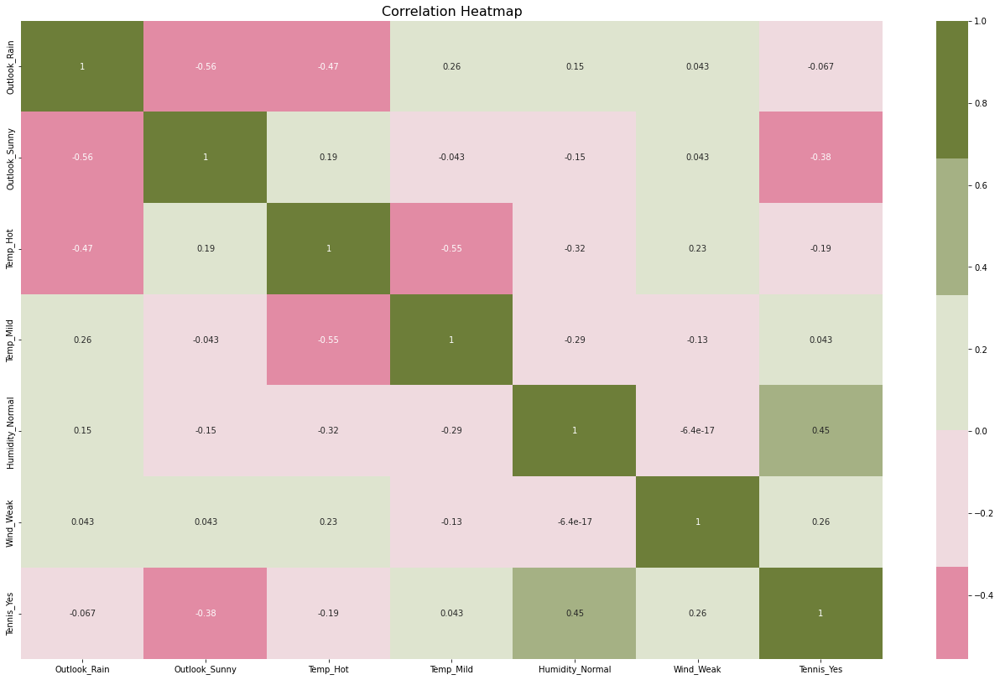

In [11]:
# Esta línea solo debe descomentarse si los plots no se dibujan correctamente
#%matplotlib inline

plt.figure(figsize = (23, 14))
cmap = sns.diverging_palette(0, 100, sep = 20)
sns.heatmap(df_dummy.corr(), annot = True, cmap = cmap, center = 0).set_title("Correlation Heatmap", fontsize = 16)
plt.show()

##Clasificación

Para este problema de ejemplo vamos a entrenar un modelo sencillo basado en [Árboles de Decisión](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html).

Los árboles de decision son algoritmos de Machine Learning supervisado. Se construye un arbol binario (cada nodo tiene dos ramas). Los valores objetivos se presentan en las hojas de los arboles.

Pero antes de poder llegar a eso debemos dividir el dataset en conjuntos adecuados para **entrenar** y **testar** el modelo.

Nos guardamos en data_x las features predictoras y en data_y la variable a predecir

In [12]:
data_x = df_dummy.drop('Tennis_Yes', axis=1)
data_y = df_dummy['Tennis_Yes']

### Entrenamiento

In [13]:
arbol_default = tree.DecisionTreeClassifier() 
arbol_default.fit(data_x, data_y)

DecisionTreeClassifier()

### Visualización del árbol

Para obtener cual class names es mayor y saber cual va primero

In [14]:
df_dummy.Tennis_Yes.value_counts()

1    9
0    5
Name: Tennis_Yes, dtype: int64

[Text(0.6, 0.9, 'Humidity_Normal <= 0.5\ngini = 0.459\nsamples = 14\nvalue = [5, 9]\nclass = Yes'),
 Text(0.4, 0.7, 'Outlook_Sunny <= 0.5\ngini = 0.49\nsamples = 7\nvalue = [4, 3]\nclass = No'),
 Text(0.3, 0.5, 'Wind_Weak <= 0.5\ngini = 0.375\nsamples = 4\nvalue = [1, 3]\nclass = Yes'),
 Text(0.2, 0.3, 'Outlook_Rain <= 0.5\ngini = 0.5\nsamples = 2\nvalue = [1, 1]\nclass = No'),
 Text(0.1, 0.1, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = Yes'),
 Text(0.3, 0.1, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]\nclass = No'),
 Text(0.4, 0.3, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]\nclass = Yes'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]\nclass = No'),
 Text(0.8, 0.7, 'Wind_Weak <= 0.5\ngini = 0.245\nsamples = 7\nvalue = [1, 6]\nclass = Yes'),
 Text(0.7, 0.5, 'Outlook_Rain <= 0.5\ngini = 0.444\nsamples = 3\nvalue = [1, 2]\nclass = Yes'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]\nclass = Yes'),
 Text(0.8, 0.3, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]\nclass = N

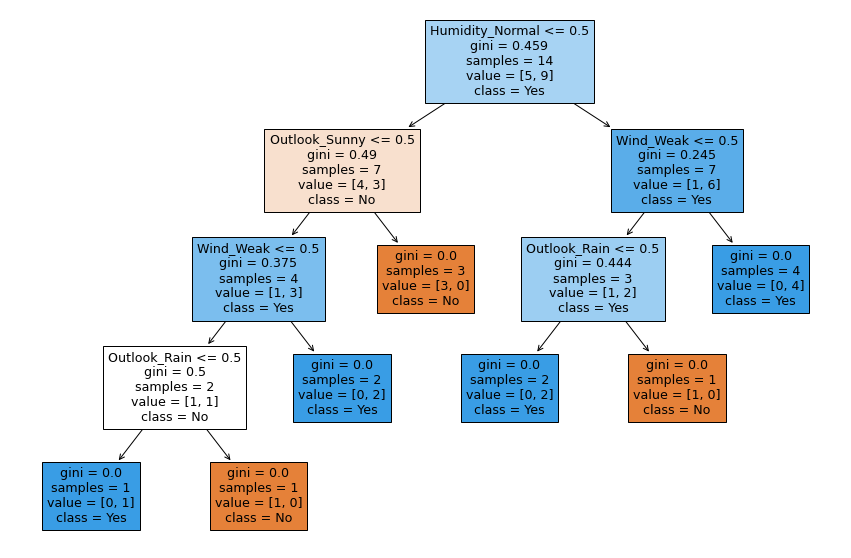

In [15]:
fig = plt.figure(figsize=(15,10))
tree.plot_tree(arbol_default, feature_names=df_dummy.columns, class_names=["No","Yes"], filled=True)

Podemos ver la importancia relativa de cada feature, calculada en el árbol para el criterio Gini (criterio por defecto)

In [16]:
importances = pd.DataFrame(arbol_default.feature_importances_.reshape(1,-1), columns=data_x.columns, index = ["importancia"])
importances

,Outlook_Rain,Outlook_Sunny,Temp_Hot,Temp_Mild,Humidity_Normal,Wind_Weak
importancia,0.362963,0.3,0.0,0.0,0.2,0.137037


Entreanamos otro árbol, ajustando algunos hiperparámetros

In [17]:
arbol_entropy = tree.DecisionTreeClassifier(criterion="entropy", max_depth=2) 
arbol_entropy.fit(data_x, data_y)

DecisionTreeClassifier(criterion='entropy', max_depth=2)

[Text(0.5, 0.8333333333333334, 'Humidity_Normal <= 0.5\nentropy = 0.94\nsamples = 14\nvalue = [5, 9]\nclass = Yes'),
 Text(0.25, 0.5, 'Outlook_Sunny <= 0.5\nentropy = 0.985\nsamples = 7\nvalue = [4, 3]\nclass = No'),
 Text(0.125, 0.16666666666666666, 'entropy = 0.811\nsamples = 4\nvalue = [1, 3]\nclass = Yes'),
 Text(0.375, 0.16666666666666666, 'entropy = 0.0\nsamples = 3\nvalue = [3, 0]\nclass = No'),
 Text(0.75, 0.5, 'Outlook_Rain <= 0.5\nentropy = 0.592\nsamples = 7\nvalue = [1, 6]\nclass = Yes'),
 Text(0.625, 0.16666666666666666, 'entropy = 0.0\nsamples = 4\nvalue = [0, 4]\nclass = Yes'),
 Text(0.875, 0.16666666666666666, 'entropy = 0.918\nsamples = 3\nvalue = [1, 2]\nclass = Yes')]

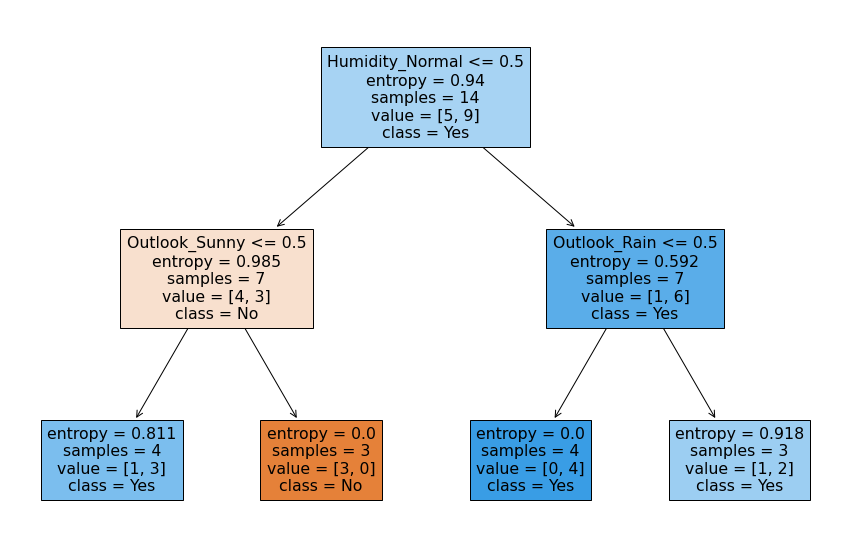

In [18]:
fig = plt.figure(figsize=(15,10))
tree.plot_tree(arbol_entropy, feature_names=df_dummy.columns, class_names=["No","Yes"], filled=True)

### Ejercicio 1
En base a lo visto en el teórico, ¿qué proceso MUY importante nos está faltando aplicar antes de entrenar nuestro modelo?

Data Splitting, separar en: {Training data, Validation data y Test Data}

### Matriz de confusion

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


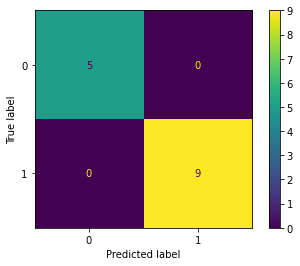

In [19]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(arbol_default, data_x, data_y) 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


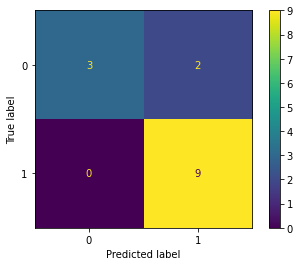

In [20]:
plot_confusion_matrix(arbol_entropy, data_x, data_y) 

### Ejercicio 2
Hacer una funcion que mida la accuracy de su modelo, luego compare el resultado con lo mismo calculado por sklearn.

Accuracy: que porcentaje de los datos fueron clasificados correctamente?

**Debe ajustar la siguiente función**

In [21]:
def calculate_accuracy(un_arbol, X_test, y_test):
  #assert type(y_true) is type(np.ndarray(shape=(2,2))), 'Only numpy.ndarray allowed in y_true.'
  #assert type(y_pred) is type(np.ndarray(shape=(2,2))), 'Only numpy.ndarray allowed in y_pred.'
  assert len(X_test) == len(y_test), 'X_test must be the same length as y_test'

  tp = 0
  tn = 0
  fp = 0
  fn = 0
  elementCount=len(y_test)

  Y_pred = un_arbol.predict(X_test)

  for i in range(elementCount):
    if Y_pred[i] == 0:
      if Y_pred[i] == y_test[i]:
        tn +=1
      else:
        fn +=1
    else:#positive cases
      if Y_pred[i] == y_test[i]:
        tp +=1
      else:
        fp +=1

  return (tp+tn)/(tp+tn+fp+fn)

In [22]:
# Técnica A
print("Técnica A - Árbol Entropy:", calculate_accuracy(arbol_entropy, data_x, data_y))

# Técnica B
from sklearn.metrics import accuracy_score
Y_pred = arbol_entropy.predict(data_x)
print("Técnica B - Árbol Entropy:", accuracy_score(Y_pred, data_y))

Técnica A - Árbol Entropy: 0.8571428571428571
Técnica B - Árbol Entropy: 0.8571428571428571


## Ejercicios - Nuevo dataset

La siguiente tarea implica el uso de un dataset real para el cual van a tener que entrenar un Árbol de decisión para detectar cáncer de mama a partir de distintas mediciones. 

La descripción del dataset la pueden encontrar aquí: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Original%29

In [23]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [24]:
breast_cancer_df=pd.read_csv("/content/drive/My Drive/data/breast-cancer-wisconsin.csv", header = None,sep = ",")
breast_cancer_df.head()

,0,1,2,3,4,5,6,7,8,9,10
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [25]:
breast_cancer_df.columns = ["Id", "clump_thicknes", "cell_size", "cell_shape", "adhesion", "epithelial_cell_size", "nuclei", "chromatin", "nucleoli", "mitoses", "target"]
breast_cancer_df.head()

,Id,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [26]:
# En el dataset las clases son 2 y 4 que representan "benigno" y "maligno" respectivamente, vamos a reemplazarlas por 0 y 1 por simplicidad.
breast_cancer_df["target"].replace(2, 0, inplace=True)
breast_cancer_df["target"].replace(4, 1, inplace=True)

# 2 era cancer benigno (ahora es 0)
# 4 era cancer maligno (ahora es 1)

La columna "Id" no aporta valor, podemos trabajarlo de distintas maneras

In [27]:
# Opcion A) Eliminamos la columna de ID ya que no nos interesa
breast_cancer_df.drop(columns="Id", inplace=True)

# Opcion B) Hacemos que el ID sea el Index
#breast_cancer_df.set_index("Id", inplace = True)
breast_cancer_df.head()

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
0,5,1,1,1,2,1,3,1,1,0
1,5,4,4,5,7,10,3,2,1,0
2,3,1,1,1,2,2,3,1,1,0
3,6,8,8,1,3,4,3,7,1,0
4,4,1,1,3,2,1,3,1,1,0


In [28]:
# Finalmente, contamos cuantos ejemplos son beningnos y cuantos no (0 = B, 1 = M)
breast_cancer_df.target.value_counts()

0    458
1    241
Name: target, dtype: int64

Es recomendable ver que valores toma cada variable, quizá no hay Null o NaN, pero si hay valores inconsistentes

In [29]:
breast_cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   clump_thicknes        699 non-null    int64 
 1   cell_size             699 non-null    int64 
 2   cell_shape            699 non-null    int64 
 3   adhesion              699 non-null    int64 
 4   epithelial_cell_size  699 non-null    int64 
 5   nuclei                699 non-null    object
 6   chromatin             699 non-null    int64 
 7   nucleoli              699 non-null    int64 
 8   mitoses               699 non-null    int64 
 9   target                699 non-null    int64 
dtypes: int64(9), object(1)
memory usage: 54.7+ KB


In [30]:
breast_cancer_df["nuclei"].value_counts()

1     402
10    132
2      30
5      30
3      28
8      21
4      19
?      16
9       9
7       8
6       4
Name: nuclei, dtype: int64

In [31]:
breast_cancer_df[breast_cancer_df["nuclei"]=='?']

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
23,8,4,5,1,2,?,7,3,1,1
40,6,6,6,9,6,?,7,8,1,0
139,1,1,1,1,1,?,2,1,1,0
145,1,1,3,1,2,?,2,1,1,0
158,1,1,2,1,3,?,1,1,1,0
164,5,1,1,1,2,?,3,1,1,0
235,3,1,4,1,2,?,3,1,1,0
249,3,1,1,1,2,?,3,1,1,0
275,3,1,3,1,2,?,2,1,1,0
292,8,8,8,1,2,?,6,10,1,1


### Ejercicio 3:  
Tratar las observaciones que tienen "?" como valor en el "nuclei". Explique por qué utilizó el método que haya decidido.

**Puede ayudarse de la siguiente función**

In [32]:
breast_cancer_df.nuclei = breast_cancer_df.nuclei.apply(lambda x: np.nan if x == '?' else x)


In [33]:
len(breast_cancer_df.nuclei)

699

In [34]:
len(breast_cancer_df[breast_cancer_df.nuclei.isnull()])

16

#### Al tratarse de tan solo 16 casos en una muestra de 699 casos, decidimos eliminar las filas que contienen nuclei = ?

In [35]:
breast_cancer_df.nuclei.isnull().mean()

0.022889842632331903

In [36]:
filt = breast_cancer_df['nuclei'].isna() == True
breast_cancer_df.drop(index = breast_cancer_df[filt].index , inplace=True)

In [37]:
breast_cancer_df.nuclei.isnull().mean()

0.0

### Ejercicio 4  
**Análisis Exploratorio**

Realice un análisis exploratorio de los datos para contestar mínimamente lo siguiente:

1.   ¿Cuantos registros tiene el dataset? 
2.   ¿Cuantos features existen y de que tipo son? ¿Habría que modificar alguno?
3.   ¿Cuantos registros hay Benignos (0) y Malignos (1)?
4.   ¿Existen variables correlacionadas? Si es así, realice las modificaciones que crea pertinente
5.   ¿Es necesario utilizar one hot enconding? ¿Por qué?
6.   ¿Es necesario realizar feature scaling? ¿Por qué?
7.   ¿La media de las variables es diferente según si el registro es bengino o maligno?
8.   Grafique las variables separando registros bengignos vs malignos

In [38]:
# Se espera más que solo hacer PandasProfile

profile = ProfileReport(breast_cancer_df)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [39]:
# En PandasProfiling veo varias celdas duplicadas, las trabajo

# Da False la primera ocurrencia de una duplicada
print(breast_cancer_df.duplicated(keep='first').value_counts(), "\n")

# Da True la última ocurrencia de una duplicada
print(breast_cancer_df.duplicated(keep='last').value_counts(), "\n")

breast_cancer_df_duplicated_rows = breast_cancer_df[breast_cancer_df.duplicated(keep='first')]
len(breast_cancer_df_duplicated_rows)

False    449
True     234
dtype: int64 

False    449
True     234
dtype: int64 



234

In [40]:
# En realidad PandasProfiling indica 48 duplicadas. Parece indicar las duplicadas distintas solamente, pero hay muchas que se repiten
breast_cancer_df_duplicated_rows.duplicated(keep='first').value_counts()

True     188
False     46
dtype: int64

In [41]:
breast_cancer_df_duplicated_rows.head()

,clump_thicknes,cell_size,cell_shape,adhesion,epithelial_cell_size,nuclei,chromatin,nucleoli,mitoses,target
28,2,1,1,1,2,1,2,1,1,0
35,2,1,1,1,2,1,2,1,1,0
48,4,1,1,3,2,1,3,1,1,0
64,1,1,1,1,2,1,2,1,1,0
66,4,1,1,1,2,1,3,1,1,0


In [42]:
breast_cancer_df_duplicated_rows.index

Int64Index([ 28,  35,  48,  64,  66,  88,  90,  92,  93,  94,
            ...
            678, 679, 683, 684, 685, 686, 688, 690, 692, 695],
           dtype='int64', length=234)

In [43]:
breast_cancer_df_without_duplicates = breast_cancer_df.drop(breast_cancer_df_duplicated_rows.index, axis=0, inplace=False)

In [44]:
breast_cancer_df_without_duplicates.shape

(449, 10)

In [45]:
breast_cancer_df_without_duplicates.duplicated(keep='first').value_counts()

False    449
dtype: int64

In [46]:
# Otra forma, más sencilla
breast_cancer_df_without_duplicates2 = breast_cancer_df.drop_duplicates(keep='first')
breast_cancer_df_without_duplicates2.shape

(449, 10)

El mapa de correlación se ve fuertemente modificado al eliminar duplicados, eran muchos

Text(0.5, 1.0, 'Correlation Heatmap')

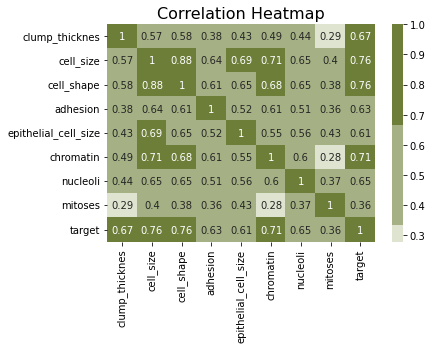

In [47]:
cmap = sns.diverging_palette(0, 100, sep = 20)
sns.heatmap(breast_cancer_df_without_duplicates2.corr(), annot = True, cmap = cmap, center = 0).set_title("Correlation Heatmap", fontsize = 16)

In [48]:
# Su código

In [49]:
# 1.   ¿Cuantos registros tiene el dataset? 
breast_cancer_df.info()
# El dataset original tenia 699 registros 
# Luego de borrar los nulos del ejercicio 3, el dataset quedó con 683 registros

<class 'pandas.core.frame.DataFrame'>
Int64Index: 683 entries, 0 to 698
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   clump_thicknes        683 non-null    int64 
 1   cell_size             683 non-null    int64 
 2   cell_shape            683 non-null    int64 
 3   adhesion              683 non-null    int64 
 4   epithelial_cell_size  683 non-null    int64 
 5   nuclei                683 non-null    object
 6   chromatin             683 non-null    int64 
 7   nucleoli              683 non-null    int64 
 8   mitoses               683 non-null    int64 
 9   target                683 non-null    int64 
dtypes: int64(9), object(1)
memory usage: 74.9+ KB


In [50]:
# 2.   ¿Cuantos features existen y de que tipo son? ¿Habría que modificar alguno?

# Hay 9 features y 1 target
# 8 features son variables de tipo numérica y 1 feature es de tipo object (nuclei)


 # 0   clump_thicknes        683 non-null    int64 
 # 1   cell_size             683 non-null    int64 
 # 2   cell_shape            683 non-null    int64 
 # 3   adhesion              683 non-null    int64 
 # 4   epithelial_cell_size  683 non-null    int64 
 # 5   nuclei                683 non-null    object
 # 6   chromatin             683 non-null    int64 
 # 7   nucleoli              683 non-null    int64 
 # 8   mitoses               683 non-null    int64

#9   target                683 non-null    int64 

# habría que cambiar nuclei a numerica:
breast_cancer_df["nuclei"] = breast_cancer_df["nuclei"].astype('int64')
breast_cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 683 entries, 0 to 698
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   clump_thicknes        683 non-null    int64
 1   cell_size             683 non-null    int64
 2   cell_shape            683 non-null    int64
 3   adhesion              683 non-null    int64
 4   epithelial_cell_size  683 non-null    int64
 5   nuclei                683 non-null    int64
 6   chromatin             683 non-null    int64
 7   nucleoli              683 non-null    int64
 8   mitoses               683 non-null    int64
 9   target                683 non-null    int64
dtypes: int64(10)
memory usage: 74.9 KB


In [51]:
#3.   ¿Cuantos registros hay Benignos (0) y Malignos (1)?
breast_cancer_df["target"].value_counts()

# 0 -- Benigno -- 444
# 1 -- Maligno -- 239

0    444
1    239
Name: target, dtype: int64

In [52]:
# 4.   ¿Existen variables correlacionadas? Si es así, realice las modificaciones que crea pertinente

# Luego de analizar la correlación (sin filas duplicadas) se puede concluir que existen variables correlacionadas (aquellas que superan 0.7 de correlación) 
# y son las siguienes:

    # cell_size con cell_shape en un 0.88
    # cell_size con chromatine en un 0.71

    # tanto cell_size como cell_shape estan correlacionadas en 0.76 con target

    # DECIDIMOS eliminar cell_size y chromatine por dos motivos:
    # 1- simplificar la complejidad del modelo
    # 2- entendemos que cell_shape y chromatine también estan correlacionadas (0.68) 

breast_cancer_df_without_duplicates2.drop(columns=["cell_size"], inplace=True)
breast_cancer_df_without_duplicates2.drop(columns=["chromatin"], inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


Text(0.5, 1.0, 'Correlation Heatmap')

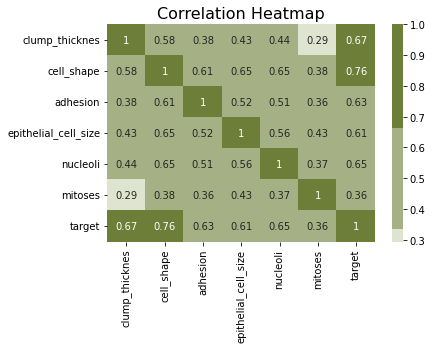

In [53]:
cmap = sns.diverging_palette(0, 100, sep = 20)
sns.heatmap(breast_cancer_df_without_duplicates2.corr(), annot = True, cmap = cmap, center = 0).set_title("Correlation Heatmap", fontsize = 16)

In [54]:
# 5.   ¿Es necesario utilizar one hot enconding? ¿Por qué?

# Como las variables son todas numericas no sería necesario.

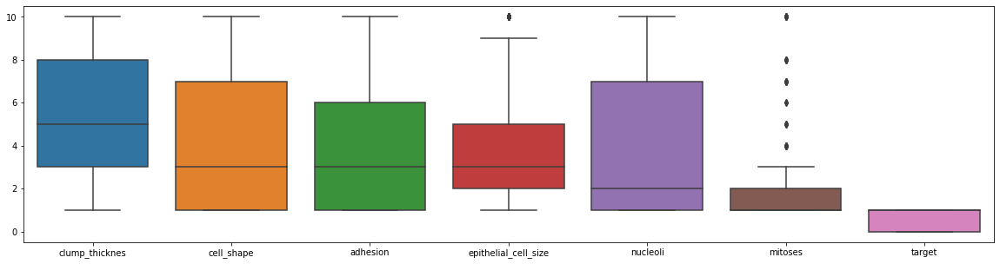

In [55]:
# 6.   ¿Es necesario realizar feature scaling? ¿Por qué?

# En el boxplot podemos observar que las hay variables NO difieren considerablemente en la ESCALA (entre 0 a 10) por lo tanto consideramos que no sería necesario

plt.figure(figsize=(20,5))
sns.boxplot(data =  breast_cancer_df_without_duplicates2)

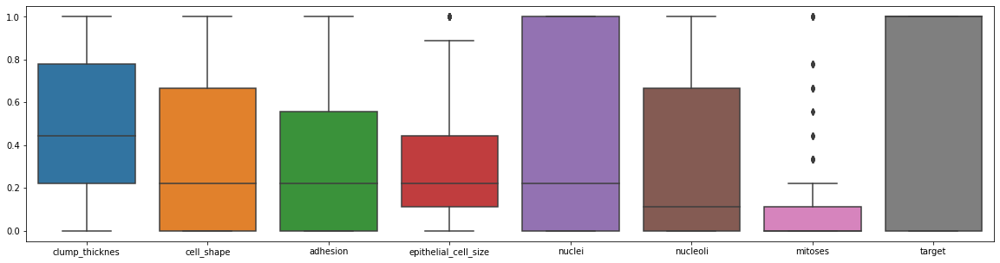

In [56]:
# En el caso de querer aplicarlo procederiamos así:

from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler = MinMaxScaler(feature_range = (0, 1))
norm = scaler.fit_transform(breast_cancer_df_without_duplicates2)
df_norm = pd.DataFrame(norm, columns = breast_cancer_df_without_duplicates2.columns)

plt.figure(figsize=(20,5))
sns.boxplot(data = df_norm)

In [57]:
# 7.   ¿La media de las variables es diferente según si el registro es bengino o maligno?
filt_1 = breast_cancer_df['target'] == 1
filt_2 = breast_cancer_df['target'] == 0

df_benigno = breast_cancer_df_without_duplicates2.copy()
df_maligno = breast_cancer_df_without_duplicates2.copy()


df_benigno.drop(index = df_benigno[filt_1].index , inplace=True)
df_maligno.drop(index = df_maligno[filt_2].index , inplace=True)

print("Promedios benignos:")
print(df_benigno.mean())
print("--------------")
print("Promedios malignos:")
print(df_maligno.mean())
print("--------------")

# SE PUEDE COMPROBAR QUE SI HAY DIFERENCIA 

Promedios benignos:
clump_thicknes           3.356808e+00
cell_shape               1.765258e+00
adhesion                 1.652582e+00
epithelial_cell_size     2.300469e+00
nuclei                  5.175639e+212
nucleoli                 1.530516e+00
mitoses                  1.136150e+00
target                   0.000000e+00
dtype: float64
--------------
Promedios malignos:
clump_thicknes          7.203390
cell_shape              6.538136
adhesion                5.635593
epithelial_cell_size    5.305085
nuclei                       inf
nucleoli                5.902542
mitoses                 2.614407
target                  1.000000
dtype: float64
--------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.


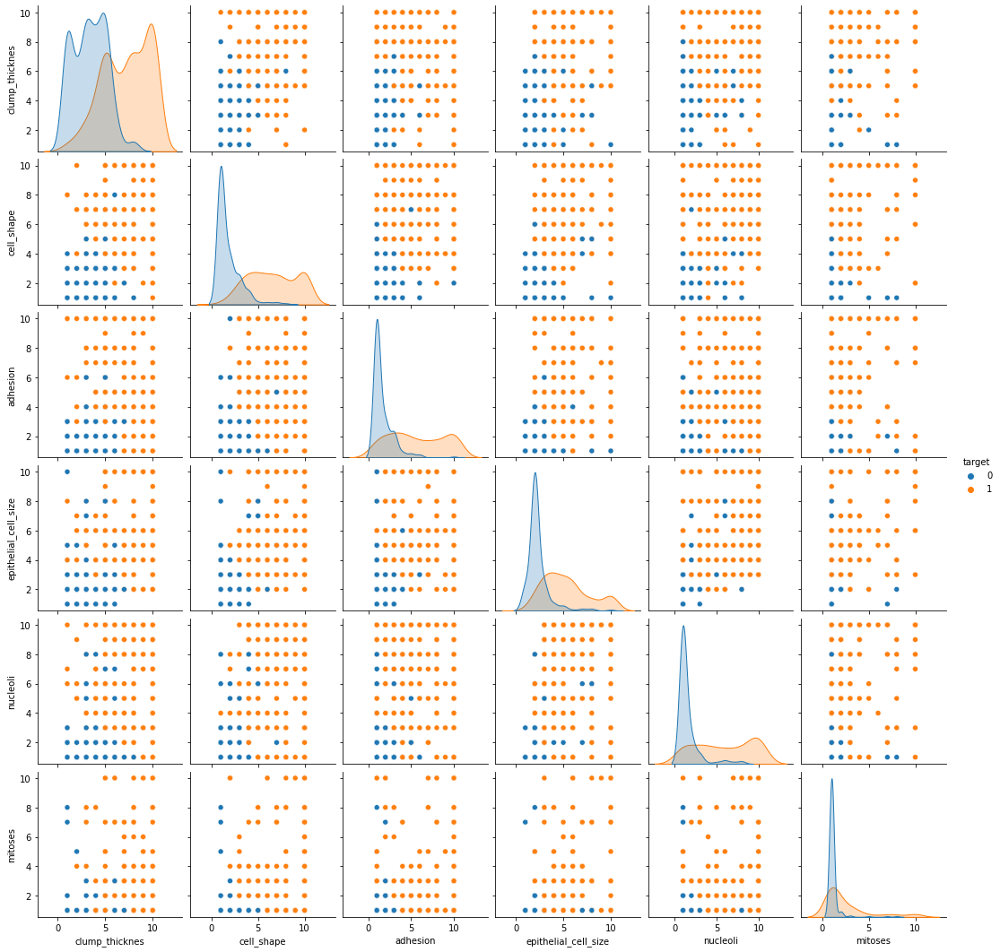

In [58]:
# 8.   Grafique las variables separando registros bengignos vs malignos

sns.pairplot(breast_cancer_df_without_duplicates2, hue = 'target')

###Ejercicio 5:  
**Arbol de decisión**

Cree un Árbol de Decisión para este set de datos que alcance al menos 93% de accuracy. 
Recuerde realizar los siguientes pasos:
- Separar los datos en conjuntos de train y test
- Entrenar el modelo
- Evaluar el modelo
- Graficar el arbol

Es un proceso iterativo y debe entrenar al menos 3 árboles con distintos hiperparámetros. Elija uno y explique por qué.

In [59]:
df = breast_cancer_df_without_duplicates2.copy(deep=True)

In [60]:
from sklearn.model_selection import train_test_split

random_state = 42

X = df.drop(['target'],axis=1)
y = df['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state = random_state)

In [61]:
print(f'df shape = {df.shape}\n')
print(f'X_train shape = {X_train.shape}')
print(f'y_train shape = {y_train.shape}\n')
print(f'X_test shape = {X_test.shape}')
print(f'y_test shape = {y_test.shape}')

df shape = (449, 8)

X_train shape = (291, 7)
y_train shape = (291,)

X_test shape = (158, 7)
y_test shape = (158,)


#### Entreno 3 Árboles

In [62]:
# Árbol 1 
arbol_1 = tree.DecisionTreeClassifier(criterion="entropy", max_depth=5) 
arbol_1.fit(X_train, y_train)

# Árbol 2 
arbol_2 = tree.DecisionTreeClassifier(criterion="gini", max_depth=2) 
arbol_2.fit(X_train, y_train)

# Árbol 3 
arbol_3 = tree.DecisionTreeClassifier(criterion="entropy", min_samples_leaf=2) 
arbol_3.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', min_samples_leaf=2)

#### Evalúo los 3 Árboles

In [63]:
print("Árbol 1:\n", classification_report(y_test, arbol_1.predict(X_test)))
print("Árbol 2:\n", classification_report(y_test, arbol_2.predict(X_test)))
print("Árbol 3:\n", classification_report(y_test, arbol_3.predict(X_test)))

Árbol 1:
               precision    recall  f1-score   support

           0       1.00      0.93      0.96        81
           1       0.93      1.00      0.96        77

    accuracy                           0.96       158
   macro avg       0.96      0.96      0.96       158
weighted avg       0.96      0.96      0.96       158

Árbol 2:
               precision    recall  f1-score   support

           0       0.88      0.93      0.90        81
           1       0.92      0.87      0.89        77

    accuracy                           0.90       158
   macro avg       0.90      0.90      0.90       158
weighted avg       0.90      0.90      0.90       158

Árbol 3:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94        81
           1       0.92      0.95      0.94        77

    accuracy                           0.94       158
   macro avg       0.94      0.94      0.94       158
weighted avg       0.94      0.94      0.94 

#### Grafico Árbol_1 
Luego de evaluar los 3 árboles seleccionamos el arbol_1 porque tiene mejores métricas que el resto

[Text(0.4625, 0.9166666666666666, 'cell_shape <= 2.5\nentropy = 0.994\nsamples = 291\nvalue = [132, 159]\nclass = Maligno'),
 Text(0.2, 0.75, 'clump_thicknes <= 5.5\nentropy = 0.337\nsamples = 112\nvalue = [105, 7]\nclass = Benigno'),
 Text(0.1, 0.5833333333333334, 'nuclei <= 4.5\nentropy = 0.138\nsamples = 103\nvalue = [101, 2]\nclass = Benigno'),
 Text(0.05, 0.4166666666666667, 'entropy = 0.0\nsamples = 95\nvalue = [95, 0]\nclass = Benigno'),
 Text(0.15, 0.4166666666666667, 'adhesion <= 2.0\nentropy = 0.811\nsamples = 8\nvalue = [6, 2]\nclass = Benigno'),
 Text(0.1, 0.25, 'entropy = 0.0\nsamples = 6\nvalue = [6, 0]\nclass = Benigno'),
 Text(0.2, 0.25, 'entropy = 0.0\nsamples = 2\nvalue = [0, 2]\nclass = Maligno'),
 Text(0.3, 0.5833333333333334, 'nuclei <= 1.5\nentropy = 0.991\nsamples = 9\nvalue = [4, 5]\nclass = Maligno'),
 Text(0.25, 0.4166666666666667, 'entropy = 0.0\nsamples = 4\nvalue = [4, 0]\nclass = Benigno'),
 Text(0.35, 0.4166666666666667, 'entropy = 0.0\nsamples = 5\nvalue

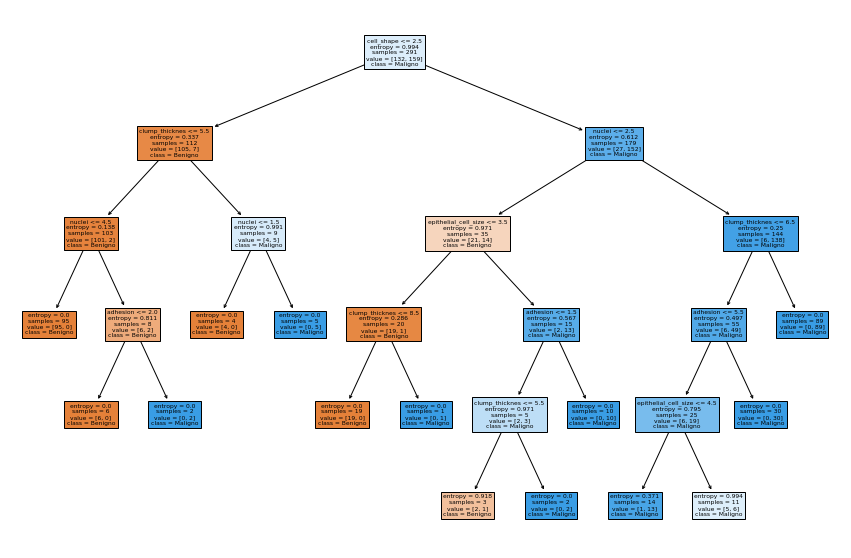

In [64]:
fig = plt.figure(figsize=(15,10))
tree.plot_tree(arbol_1, feature_names=df.columns, class_names=["Benigno","Maligno"], filled=True)

### Ejercicio 6:  
Calcule y cree un nuevo DataFrame con los valores representativos para el bias y la varianza de cada árbol entrenado.

bias = error en train
varianza = diferencia entre el error en train y el error en test

Ordénelos por complejidad y grafique ambos valores.

**Se puede apoyar en las siguientes funciones y definiciones**

In [65]:
def plot_metrics(df):
  plt.plot(df.Bias, label='Bias', color='blue')
  plt.plot(df.Variance, label='Var', color='orange')
  plt.title('%s: loss')
  plt.xlabel('Complexity')
  plt.ylabel('Error')
  plt.legend()
  plt.show()

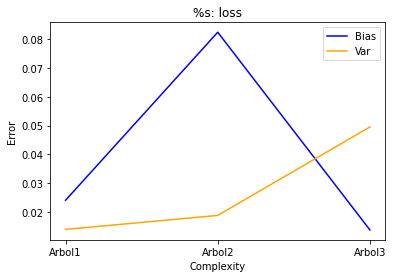

In [66]:
bias_arbol1 = 1 - accuracy_score(arbol_1.predict(X_train), y_train)
bias_arbol2 = 1 - accuracy_score(arbol_2.predict(X_train), y_train)
bias_arbol3 = 1 - accuracy_score(arbol_3.predict(X_train), y_train)

error_arbol1_test = 1 - accuracy_score(arbol_1.predict(X_test), y_test)
error_arbol2_test = 1 - accuracy_score(arbol_2.predict(X_test), y_test)
error_arbol3_test = 1 - accuracy_score(arbol_3.predict(X_test), y_test)

var_arbol1 =  error_arbol1_test - bias_arbol1 
var_arbol2 =  error_arbol2_test - bias_arbol2 
var_arbol3 =  error_arbol3_test - bias_arbol3 


df_bias_variance = pd.DataFrame(
    {
        "Bias": [bias_arbol1, bias_arbol2, bias_arbol3],
        "Variance": [var_arbol1, var_arbol2, var_arbol3]
    },
    index = ["Arbol1", "Arbol2", "Arbol3"])

plot_metrics(df_bias_variance)



**Formato de entrega**: esta misma notebook en formato .ipynb, cambiar el nombre por ApellidoNombre1_ApellidoNombre2_Tarea_1.
Es importante que la notebook pueda ejecutarse sin problemas al seleccionar 'Ejecutar todo'.


**Plazo de entrega**: hasta el 10/10 a través de Aulas.